In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
from IPython.display import display, Image
import aesara
import arviz
import pymc as pm
import numpy
import pandas
from matplotlib import pyplot
import ipywidgets
import pathlib

import dataloading
import models
import plotting

You are running the v4 development version of PyMC which currently still lacks key features. You probably want to use the stable v3 instead which you can either install via conda or find on the v3 GitHub branch: https://github.com/pymc-devs/pymc/tree/v3


### Fetch data and calibrations

In [3]:
cmX360 = models.LogisticBiomassAbsorbanceModel.load("cm_biomass_A360.json")
cmX600 = models.LogisticBiomassAbsorbanceModel.load("cm_biomass_A600.json")
cmP360 = models.LinearProductAbsorbanceModel.load("cm_product_A360.json")

design_cols = ["iptg", "glucose"]
df_layout = dataloading.get_layout(r"FullWellDescription.xlsx", design_cols)
df_time, df_A360, df_A600 = dataloading.vectorize_observations(
    df_layout,
    observations={
        f"Carboxylase_{v}": (
            dataloading.read_absorbances(rf"Carboxylase_{v}_360nm.csv"),
            dataloading.read_absorbances(rf"Carboxylase_{v}_600nm.csv"),
        )
        for v in [19, 20, 21, 23]
    }
)
df_commons = dataloading.count_replicates(df_layout)

display(df_commons.head())

120 rows were dropped because a product concentration was unknown AND information in columns ['iptg', 'glucose'] was incomplete.


,,Carboxylase_19,Carboxylase_20,Carboxylase_21,Carboxylase_23,n_replicates,redundancy
design_id,group,,,,,,
81N4D,3.2/4.8,4,4,0,0,8,✅ (2)
CT9D5,2.4/2.0,0,0,4,4,8,✅ (2)
7CLLR,12.0/2.0,0,0,4,4,8,✅ (2)
LRHE9,6.0/2.0,0,0,4,4,8,✅ (2)
7PRRD,1.2/2.0,0,0,4,4,8,✅ (2)


In [4]:
fp = pathlib.Path("03.3_multibatch_GP_RW.nc")
idata = arviz.from_netcdf(fp)

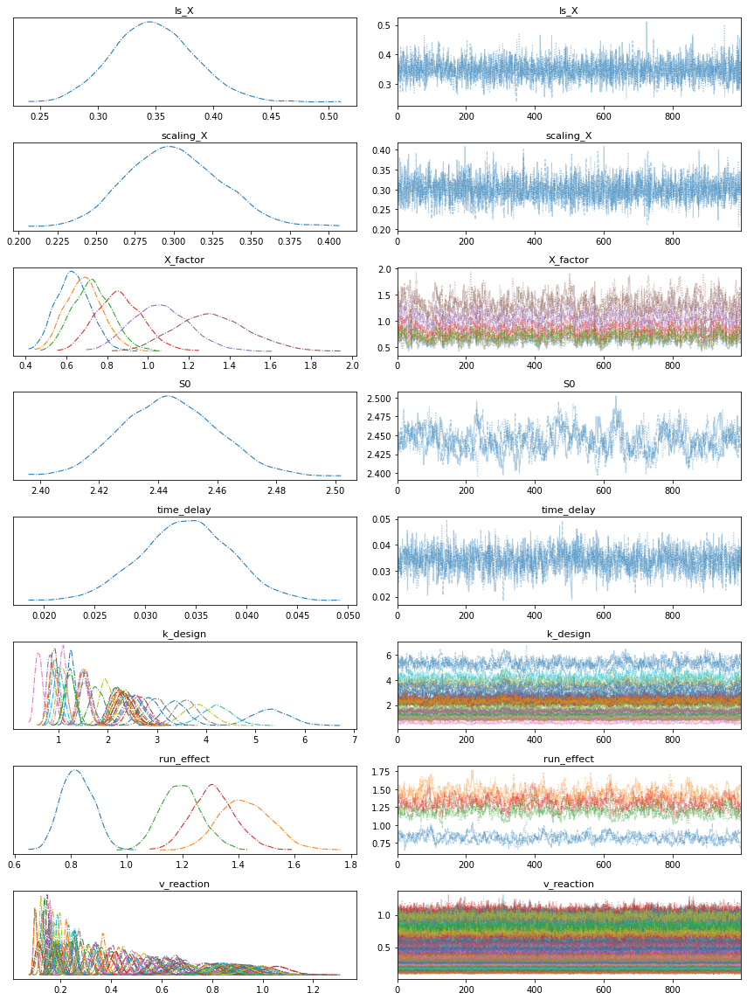

In [5]:
interesting_variables = [
    "ls_X",
    "scaling_X",
    "X_factor",
    #"log_dXdC",
    "S0",
    "time_delay",
    "k_design",
    "run_effect",
    "v_reaction",
]
arviz.plot_trace(idata, var_names=interesting_variables, combined=True)
pyplot.tight_layout()

In [6]:
summary = plotting.summarize(idata, df_layout)
summary.to_excel("03.4_summary.xlsx")
summary

,run,assay_well,reactor,group,product,biomass,iptg,glucose,design_id,reactor_id,p_best_design,k_design_mM/h/CDW_lower,k_design_mM/h/CDW,k_design_mM/h/CDW_upper,v_design_mM/h_lower,v_design_mM/h,v_design_mM/h_upper,v_reaction_mM/h_lower,v_reaction_mM/h,v_reaction_mM/h_upper
replicate_id,,,,,,,,,,,,,,,,,,,,
PE83K,Carboxylase_19,H01,H1,0.32/4.8,NaN,NaN,0.32,4.8,K9QEL,HX3AY,0.0,0.467339,0.593324,0.72051,0.054181,0.069832,0.084996,0.091556,0.113701,0.134254
QT7E6,Carboxylase_19,E01,E1,0.32/4.8,NaN,NaN,0.32,4.8,K9QEL,LFN9D,0.0,0.467339,0.593324,0.72051,0.054181,0.069832,0.084996,0.098434,0.120693,0.143922
53PNH,Carboxylase_19,F01,F1,0.32/4.8,NaN,NaN,0.32,4.8,K9QEL,8Z8D6,0.0,0.467339,0.593324,0.72051,0.054181,0.069832,0.084996,0.090767,0.114136,0.138664
3EZZN,Carboxylase_19,G01,G1,0.32/4.8,NaN,NaN,0.32,4.8,K9QEL,RE3MY,0.0,0.467339,0.593324,0.72051,0.054181,0.069832,0.084996,0.093465,0.117712,0.14332
X9PP3,Carboxylase_19,D01,D1,0.24/4.8,NaN,NaN,0.24,4.8,9MWZT,DDQZ9,0.0,0.71491,0.842918,0.981094,0.084003,0.099049,0.117832,0.143143,0.164511,0.189831
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Q5PD3,Carboxylase_21,E04,E4,12.0/1.5,NaN,NaN,12.00,1.5,XWPQC,H5LKZ,0.0,3.721517,4.217944,4.725866,0.224122,0.258782,0.293233,0.553726,0.616109,0.672905
EP1D1,Carboxylase_21,H02,H2,12.0/1.0,NaN,NaN,12.00,1.0,16ZMH,P6Q9P,1.0,4.718639,5.311148,5.898775,0.259566,0.299864,0.335501,0.620815,0.667864,0.711829
1YZ65,Carboxylase_21,E02,E2,12.0/1.0,NaN,NaN,12.00,1.0,16ZMH,RBC66,1.0,4.718639,5.311148,5.898775,0.259566,0.299864,0.335501,0.618075,0.654484,0.690916


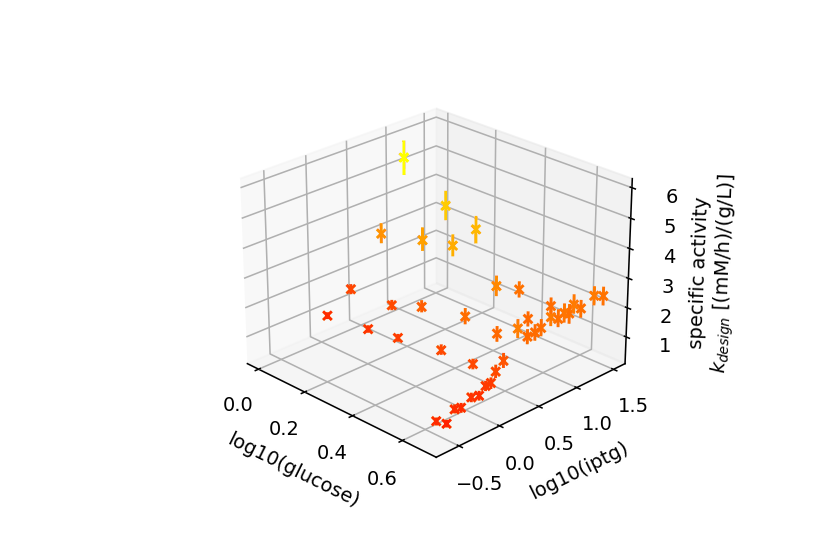

In [7]:
def fn_plot3d(t):
    plotting.plot_3d_k_design(idata, azim=-45+30*numpy.sin(t*2*numpy.pi))
    
#fn_plot3d(0)

fp_out = plotting.plot_gif(
    fn_plot=fn_plot3d,
    fp_out="03.4_multibatch3d.gif",
    data=numpy.arange(0, 1, 1/60),
    fps=15,
    delay_frames=0
)
Image(fp_out)

In [8]:
def fn_plot(rid):
    plotting.plot_reaction(idata, rid, cm_600=cmX600, reaction_order=summary.index)
    return

ipywidgets.interact(
    fn_plot,
    rid=summary.index,
);

interactive(children=(Dropdown(description='rid', options=('PE83K', 'QT7E6', '53PNH', '3EZZN', 'X9PP3', 'LB36N…

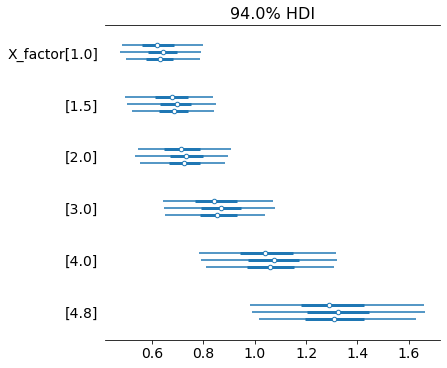

In [9]:
arviz.plot_forest(idata.posterior.X_factor);

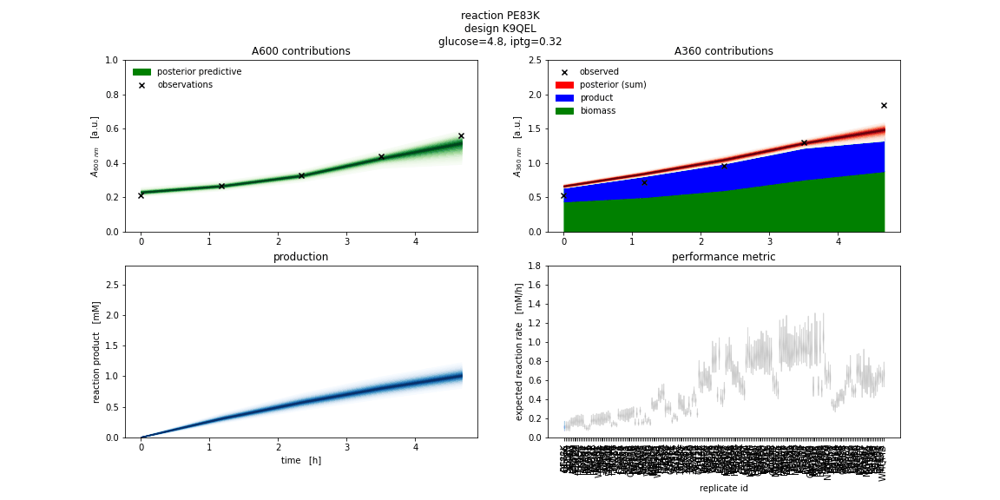

In [13]:
fp_out = plotting.plot_gif(
    fn_plot=fn_plot,
    fp_out="03.4_multibatch.gif",
    data=summary.index,
    fps=3
)
Image(fp_out)

In [14]:
%load_ext watermark
%watermark -n -u -v -iv -w

Last updated: Wed Nov 17 2021

Python implementation: CPython
Python version       : 3.8.10
IPython version      : 7.22.0

matplotlib: 3.4.2
ipywidgets: 7.6.3
arviz     : 0.11.4
numpy     : 1.21.0
aesara    : 2.2.6
pymc      : 4.0.0
pandas    : 1.3.0

Watermark: 2.2.0

